# Image processing programming assignment - 2
---
### - You have to take an image of your face. Make sure you're wearing clear spectacles so that more edges are visible. 
### - There should be three images(one clear image, one with gaussian noise and one with salt and pepper noise)
### - Perform 5 edge detection techniques on these three images (you can apply more if you want)
### - Compare which edge detection technique works best on which image. Prepare a report for the same.
---

### Images used
    - Taj Mahal
    - Photo of myself

### Noises applied
    - Gaussian Noise
    - Salt and Pepper Noise

### Edge Detection Techniques used
    - Sobel X
    - Sobel Y
    - Sobel XY
    - Canny
    - Laplacian
    - Prewitt X
    - Prewitt Y
    - Roberts
---

#### IMPORTING ALL THE NECESSARY LIBRARIES

In [3]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import random
from scipy import ndimage
import skimage

#### Importing the original image and converting it to grayscale

(605, 885)


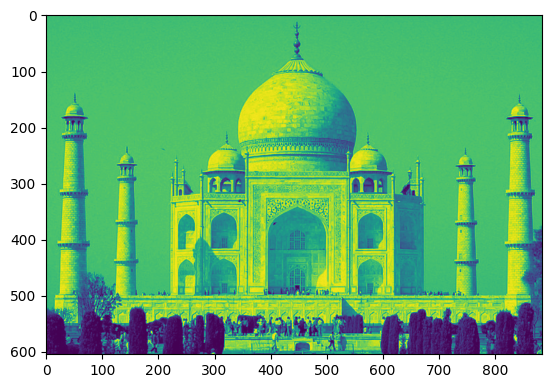

In [4]:
# Importing the original image and converting in grayscale

original_image = cv.imread("taj.png")
gray_image = cv.cvtColor(original_image, cv.COLOR_RGB2GRAY)
print(gray_image.shape)
imgplot = plt.imshow(gray_image)
plt.show()

#### Adding Gaussian Noise to gray scale image

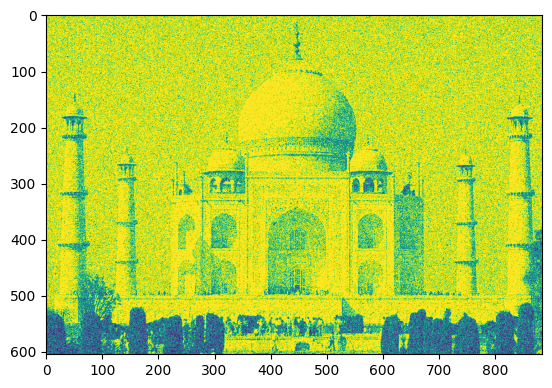

In [5]:
# Gaussian Noise

gaussian_noise_image = skimage.util.random_noise(gray_image, mode='gaussian', mean=0.3, var=0.05)
gaussina_noise_image = np.array(255*gaussian_noise_image, dtype='uint16')
imgplot = plt.imshow(gaussian_noise_image)
plt.show()

#### Function that adds salt and pepper noise to gray scale image

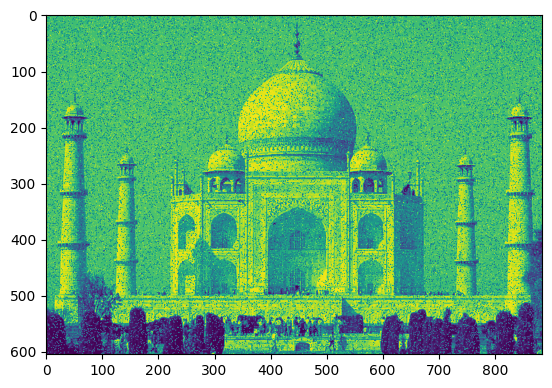

In [6]:
# Creating a function that'll add Salt and Pepper noise to the image

def add_salt_pepper_noise(gray_image, noise_magnitude):
    salt_pepper_image = np.zeros(gray_image.shape, np.uint8)
    threshold = 1 - noise_magnitude
    for i in range(gray_image.shape[0]):
        for j in range(gray_image.shape[1]):
            random_var = random.random()
            if random_var < noise_magnitude:
                salt_pepper_image[i][j] = 0
            elif random_var > threshold:
                salt_pepper_image[i][j] = 255
            else:
                salt_pepper_image[i][j] = gray_image[i][j]
    
    return salt_pepper_image


salt_pepper_noise_image = add_salt_pepper_noise(gray_image, 0.05)
imgplot = plt.imshow(salt_pepper_noise_image)
plt.show()

#### Comparing the original image with grayscale image, image with gaussian noise, image with salt and pepper noise

Text(0.5, 1.0, 'Salt & Pepper_Noisy_Image')

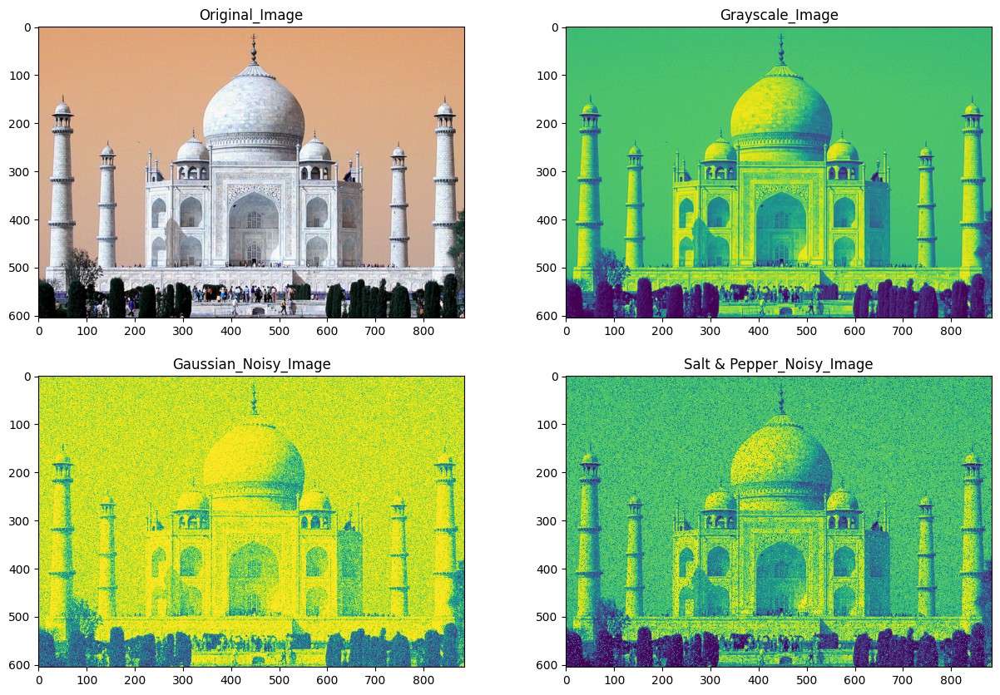

In [7]:
# Comparing the images

fig = plt.figure(figsize=(15, 10))

fig.add_subplot(2, 2, 1)
plt.imshow(original_image)
plt.title("Original_Image")

fig.add_subplot(2, 2, 2)
plt.imshow(gray_image)
plt.title("Grayscale_Image")

fig.add_subplot(2, 2, 3)
plt.imshow(gaussian_noise_image)
plt.title("Gaussian_Noisy_Image")

fig.add_subplot(2, 2, 4)
plt.imshow(salt_pepper_noise_image)
plt.title("Salt & Pepper_Noisy_Image")


#### Function to find out the edges of an image using the Roberts edge detection method

In [8]:
# Function for applying roberts edge detection

def robert_edge_detection(input_image):
    
    input_image = input_image.astype('float64')
    input_image /= 255
    
    roberts_x_mask = np.array([[0, 1],
                               [-1, 0]])
    roberts_y_mask = np.array([[1, 0],
                               [0, -1]])
    
    x_axis = ndimage.convolve(input_image, roberts_x_mask)
    y_axis = ndimage.convolve(input_image, roberts_y_mask)
    
    roberts_image = np.sqrt(np.square(x_axis) + np.square(y_axis))
    roberts_image *= 255
    
    return roberts_image

#### Applying all the different edge detection techniques on the gray scale image. Then, displaying all the results in a single plot

Text(0.5, 1.0, 'Roberts Image')

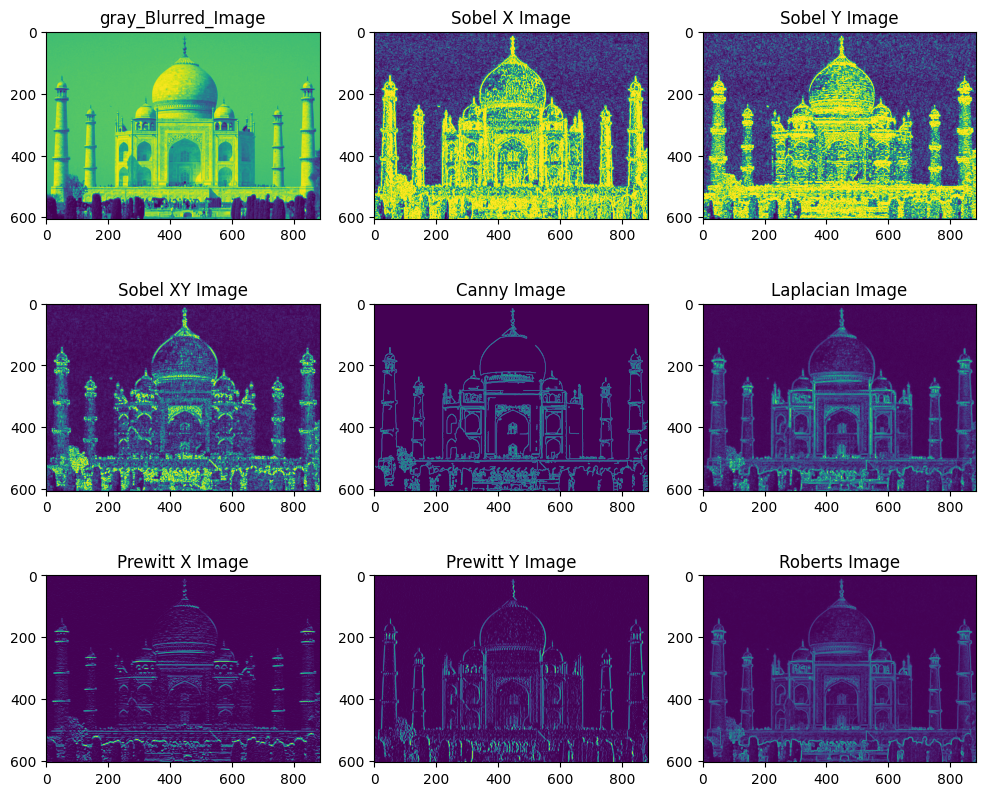

In [9]:
# Edge Detection on gray_image
# First we will apply gaussian blur with a 3x3 kernel size

gray_blurred_image = cv.GaussianBlur(gray_image, (3, 3), 0)

# Sobel_X

gray_sobel_x = cv.Sobel(src=gray_blurred_image, ddepth=cv.CV_64F, dx=1, dy=0, ksize=5)
gray_sobel_x_image = cv.convertScaleAbs(gray_sobel_x)

# Sobel_Y

gray_sobel_y = cv.Sobel(src=gray_blurred_image, ddepth=cv.CV_64F, dx=0, dy=1, ksize=5)
gray_sobel_y_image = cv.convertScaleAbs(gray_sobel_y)

# Sobel_XY

gray_sobel_xy = cv.Sobel(src=gray_blurred_image, ddepth=cv.CV_64F, dx=1, dy=1, ksize=5)
gray_sobel_xy_image = cv.convertScaleAbs(gray_sobel_xy)


# Canny

var = np.median(gray_blurred_image)
sigma = 0.33
lower = int(max(0, (1.0 - sigma) * var))
upper = int(min(255, (1.0 + sigma) * var))
gray_canny_image = cv.Canny(image=gray_blurred_image, threshold1=lower, threshold2=upper)


# Laplacian

gray_laplacian = cv.Laplacian(gray_blurred_image, cv.CV_64F, ksize=3)
gray_laplacian_image = cv.convertScaleAbs(gray_laplacian)


# Prewitt

gray_prewitt_x_mask = np.array([[1, 1, 1], 
                                   [0, 0, 0], 
                                   [-1, -1, -1]])
gray_prewitt_y_mask = np.array([[-1, 0, 1], 
                                   [-1, 0, 1], 
                                   [-1, 0, 1]])

gray_prewitt_x_image = cv.filter2D(gray_blurred_image, -1, gray_prewitt_x_mask)
gray_prewitt_y_image = cv.filter2D(gray_blurred_image, -1, gray_prewitt_y_mask)


# Roberts

gray_roberts_image = robert_edge_detection(gray_blurred_image)



fig = plt.figure(figsize=(12, 10))

fig.add_subplot(3, 3, 1)
plt.imshow(gray_blurred_image)
plt.title("gray_Blurred_Image")

fig.add_subplot(3, 3, 2)
plt.imshow(gray_sobel_x_image)
plt.title("Sobel X Image")

fig.add_subplot(3, 3, 3)
plt.imshow(gray_sobel_y_image)
plt.title("Sobel Y Image")

fig.add_subplot(3, 3, 4)
plt.imshow(gray_sobel_xy_image)
plt.title("Sobel XY Image")

fig.add_subplot(3, 3, 5)
plt.imshow(gray_canny_image)
plt.title("Canny Image")

fig.add_subplot(3, 3, 6)
plt.imshow(gray_laplacian_image)
plt.title("Laplacian Image")

fig.add_subplot(3, 3, 7)
plt.imshow(gray_prewitt_x_image)
plt.title("Prewitt X Image")

fig.add_subplot(3, 3, 8)
plt.imshow(gray_prewitt_y_image)
plt.title("Prewitt Y Image")

fig.add_subplot(3, 3, 9)
plt.imshow(gray_roberts_image)
plt.title("Roberts Image")

#### Applying all the different edge detection techniques on the image with Gaussian noise and then displaying them side by side in a single plot

Text(0.5, 1.0, 'Gaussian_Noise Roberts Image')

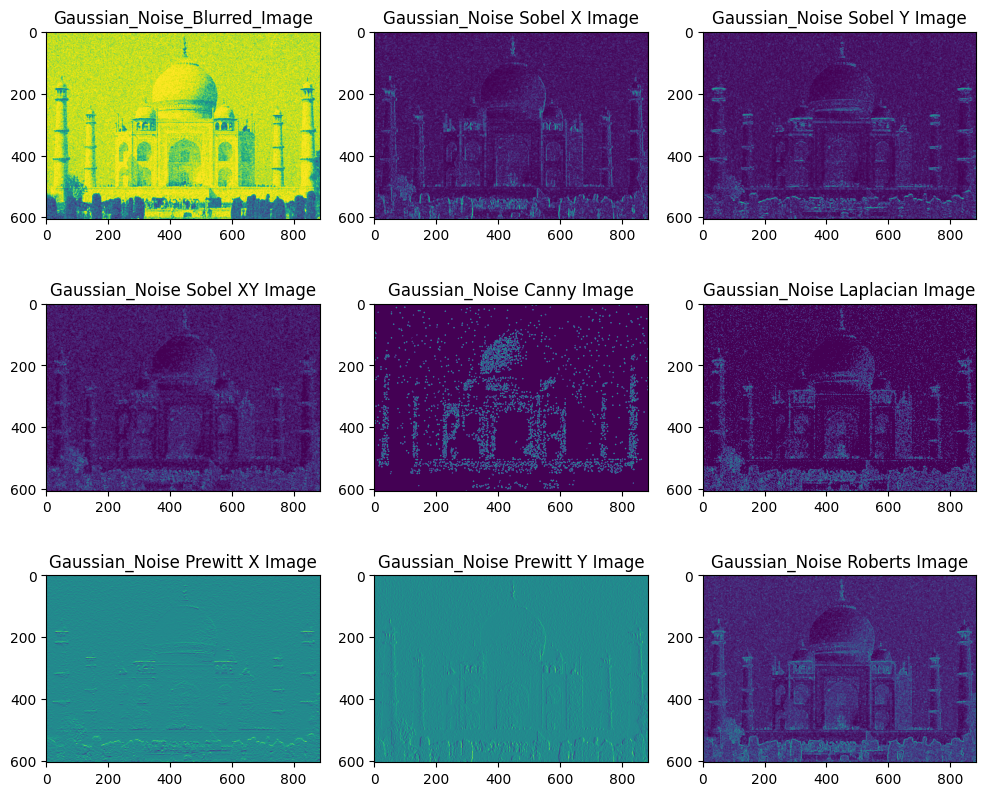

In [10]:
# Edge Detection on Gaussian Image
# Firstly we will apply Gaussian Blur

gaussian_noise_blurred_image = cv.GaussianBlur(gaussian_noise_image, (3, 3), 0)

# Sobel_X

gaussian_noise_sobel_x = cv.Sobel(src=gaussian_noise_blurred_image, ddepth=cv.CV_64F, dx=1, dy=0, ksize=5)
gaussian_noise_sobel_x_image = cv.convertScaleAbs(gaussian_noise_sobel_x)

# Sobel_Y

gaussian_noise_sobel_y = cv.Sobel(src=gaussian_noise_blurred_image, ddepth=cv.CV_64F, dx=0, dy=1, ksize=5)
gaussian_noise_sobel_y_image = cv.convertScaleAbs(gaussian_noise_sobel_y)

# Sobel_XY

gaussian_noise_sobel_xy = cv.Sobel(src=gaussian_noise_blurred_image, ddepth=cv.CV_64F, dx=1, dy=1, ksize=5)
gaussian_noise_sobel_xy_image = cv.convertScaleAbs(gaussian_noise_sobel_xy)


# Canny

canny_int8_image = np.uint8(gaussian_noise_blurred_image)
var = np.median(canny_int8_image)
sigma = 0.33
lower = int(max(0, (1.0 - sigma) * var))
upper = int(min(255, (1.0 + sigma) * var))
gaussian_noise_canny_image = cv.Canny(image=canny_int8_image, threshold1=lower, threshold2=upper)


# Laplacian

gaussian_noise_laplacian = cv.Laplacian(gaussian_noise_blurred_image, cv.CV_64F, ksize=3)
gaussian_noise_laplacian_image = cv.convertScaleAbs(gaussian_noise_laplacian)


# Prewitt

gaussian_noise_prewitt_x_mask = np.array([[1, 1, 1], 
                                          [0, 0, 0], 
                                          [-1, -1, -1]])
gaussian_noise_prewitt_y_mask = np.array([[-1, 0, 1], 
                                          [-1, 0, 1], 
                                          [-1, 0, 1]])

gaussian_noise_prewitt_x_image = cv.filter2D(gaussian_noise_blurred_image, -1, gaussian_noise_prewitt_x_mask)
gaussian_noise_prewitt_y_image = cv.filter2D(gaussian_noise_blurred_image, -1, gaussian_noise_prewitt_y_mask)


# Roberts

gaussian_noise_roberts_image = robert_edge_detection(gaussian_noise_blurred_image)




fig = plt.figure(figsize=(12, 10))

fig.add_subplot(3, 3, 1)
plt.imshow(gaussian_noise_blurred_image)
plt.title("Gaussian_Noise_Blurred_Image")

fig.add_subplot(3, 3, 2)
plt.imshow(gaussian_noise_sobel_x_image)
plt.title("Gaussian_Noise Sobel X Image")

fig.add_subplot(3, 3, 3)
plt.imshow(gaussian_noise_sobel_y_image)
plt.title("Gaussian_Noise Sobel Y Image")

fig.add_subplot(3, 3, 4)
plt.imshow(gaussian_noise_sobel_xy_image)
plt.title("Gaussian_Noise Sobel XY Image")

fig.add_subplot(3, 3, 5)
plt.imshow(gaussian_noise_canny_image)
plt.title("Gaussian_Noise Canny Image")

fig.add_subplot(3, 3, 6)
plt.imshow(gaussian_noise_laplacian_image)
plt.title("Gaussian_Noise Laplacian Image")

fig.add_subplot(3, 3, 7)
plt.imshow(gaussian_noise_prewitt_x_image)
plt.title("Gaussian_Noise Prewitt X Image")

fig.add_subplot(3, 3, 8)
plt.imshow(gaussian_noise_prewitt_y_image)
plt.title("Gaussian_Noise Prewitt Y Image")

fig.add_subplot(3, 3, 9)
plt.imshow(gaussian_noise_roberts_image)
plt.title("Gaussian_Noise Roberts Image")

#### Applying all the different edge detection techniques on image with salt and pepper noise and displaying them side by side on a single plot

Text(0.5, 1.0, 'Salt_Pepper_Noise Roberts Image')

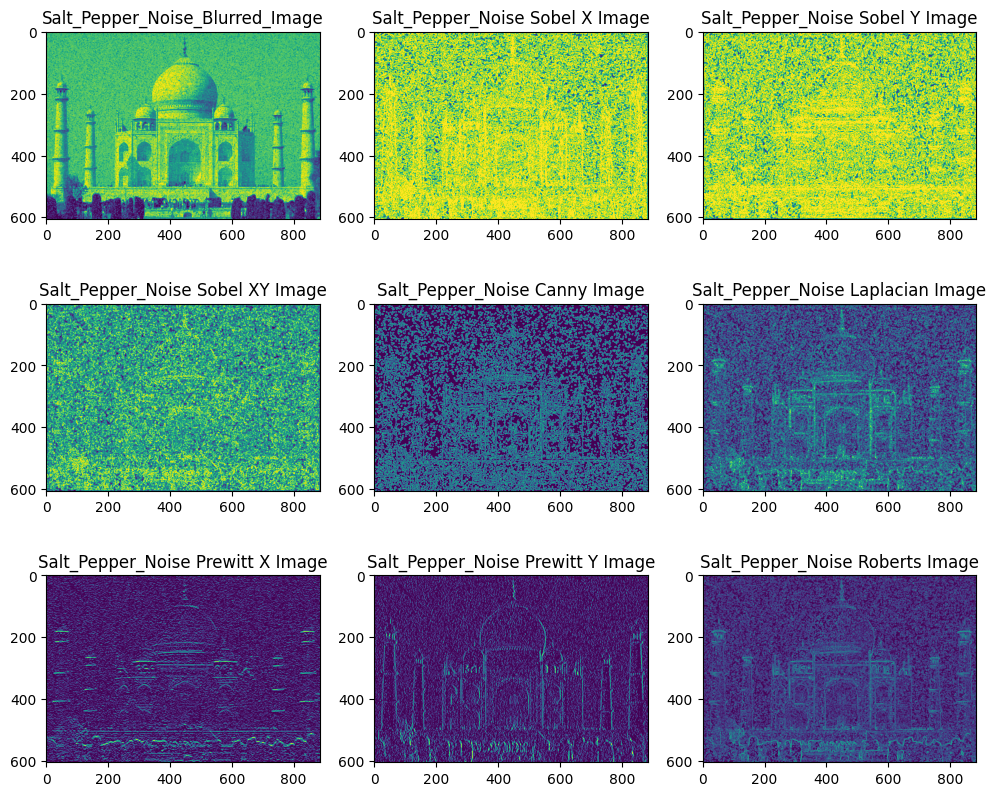

In [11]:
# Edge Detection on Salt & Pepper Noisy Images
# Firstly we will convert to blurred_image

salt_pepper_noise_blurred_image = cv.GaussianBlur(salt_pepper_noise_image, (3, 3), 0)

# Sobel_X

salt_pepper_noise_sobel_x = cv.Sobel(src=salt_pepper_noise_blurred_image, ddepth=cv.CV_64F, dx=1, dy=0, ksize=5)
salt_pepper_noise_sobel_x_image = cv.convertScaleAbs(salt_pepper_noise_sobel_x)

# Sobel_Y

salt_pepper_noise_sobel_y = cv.Sobel(src=salt_pepper_noise_blurred_image, ddepth=cv.CV_64F, dx=0, dy=1, ksize=5)
salt_pepper_noise_sobel_y_image = cv.convertScaleAbs(salt_pepper_noise_sobel_y)

# Sobel_XY

salt_pepper_noise_sobel_xy = cv.Sobel(src=salt_pepper_noise_blurred_image, ddepth=cv.CV_64F, dx=1, dy=1, ksize=5)
salt_pepper_noise_sobel_xy_image = cv.convertScaleAbs(salt_pepper_noise_sobel_xy)


# Canny

var = np.median(salt_pepper_noise_blurred_image)
sigma = 0.33
lower = int(max(0, (1.0 - sigma) * var))
upper = int(min(255, (1.0 + sigma) * var))
salt_pepper_noise_canny_image = cv.Canny(image=salt_pepper_noise_blurred_image, threshold1=lower, threshold2=upper)


# Laplacian

salt_pepper_noise_laplacian = cv.Laplacian(salt_pepper_noise_blurred_image, cv.CV_64F, ksize=3)
salt_pepper_noise_laplacian_image = cv.convertScaleAbs(salt_pepper_noise_laplacian)


# Prewitt

salt_pepper_noise_prewitt_x_mask = np.array([[1, 1, 1], 
                                             [0, 0, 0], 
                                             [-1, -1, -1]])
salt_pepper_noise_prewitt_y_mask = np.array([[-1, 0, 1], 
                                             [-1, 0, 1], 
                                             [-1, 0, 1]])

salt_pepper_noise_prewitt_x_image = cv.filter2D(salt_pepper_noise_blurred_image, -1, salt_pepper_noise_prewitt_x_mask)
salt_pepper_noise_prewitt_y_image = cv.filter2D(salt_pepper_noise_blurred_image, -1, salt_pepper_noise_prewitt_y_mask)


# Roberts

salt_pepper_noise_roberts_image = robert_edge_detection(salt_pepper_noise_blurred_image)





fig = plt.figure(figsize=(12, 10))

fig.add_subplot(3, 3, 1)
plt.imshow(salt_pepper_noise_blurred_image)
plt.title("Salt_Pepper_Noise_Blurred_Image")

fig.add_subplot(3, 3, 2)
plt.imshow(salt_pepper_noise_sobel_x_image)
plt.title("Salt_Pepper_Noise Sobel X Image")

fig.add_subplot(3, 3, 3)
plt.imshow(salt_pepper_noise_sobel_y_image)
plt.title("Salt_Pepper_Noise Sobel Y Image")

fig.add_subplot(3, 3, 4)
plt.imshow(salt_pepper_noise_sobel_xy_image)
plt.title("Salt_Pepper_Noise Sobel XY Image")

fig.add_subplot(3, 3, 5)
plt.imshow(salt_pepper_noise_canny_image)
plt.title("Salt_Pepper_Noise Canny Image")

fig.add_subplot(3, 3, 6)
plt.imshow(salt_pepper_noise_laplacian_image)
plt.title("Salt_Pepper_Noise Laplacian Image")

fig.add_subplot(3, 3, 7)
plt.imshow(salt_pepper_noise_prewitt_x_image)
plt.title("Salt_Pepper_Noise Prewitt X Image")

fig.add_subplot(3, 3, 8)
plt.imshow(salt_pepper_noise_prewitt_y_image)
plt.title("Salt_Pepper_Noise Prewitt Y Image")

fig.add_subplot(3, 3, 9)
plt.imshow(salt_pepper_noise_roberts_image)
plt.title("Salt_Pepper_Noise Roberts Image")

#### Finally comparing all the images with respective noises and respective edge detection techniques side by side on a single plot

Text(0.5, 1.0, 'Salt & Pepper Noisy Roberts Image')

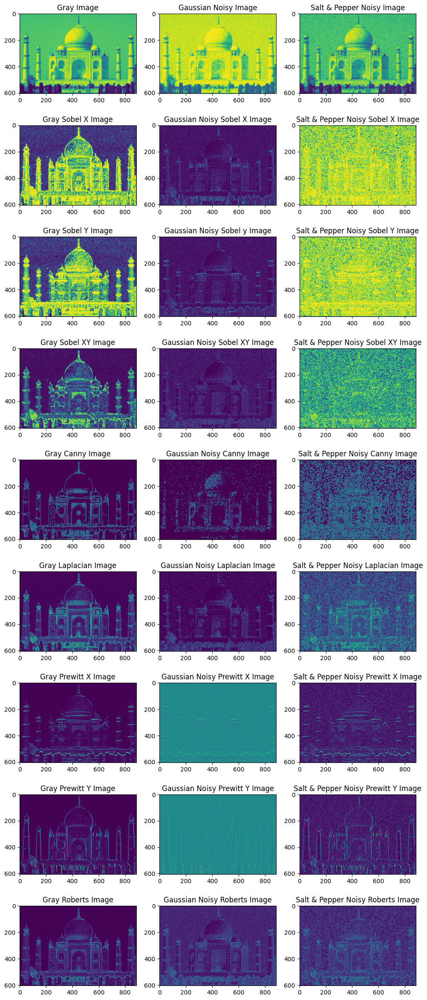

In [12]:
# Final Images Comparison


fig = plt.figure(figsize=(12, 30))

# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 1)
plt.imshow(gray_blurred_image)
plt.title("Gray Image")

fig.add_subplot(9, 3, 2)
plt.imshow(gaussian_noise_blurred_image)                                                               # Input Images
plt.title("Gaussian Noisy Image")

fig.add_subplot(9, 3, 3)
plt.imshow(salt_pepper_noise_blurred_image)
plt.title("Salt & Pepper Noisy Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 4)
plt.imshow(gray_sobel_x_image)
plt.title("Gray Sobel X Image")

fig.add_subplot(9, 3, 5)
plt.imshow(gaussian_noise_sobel_x_image)                                                             # Sobel X Images
plt.title("Gaussian Noisy Sobel X Image")

fig.add_subplot(9, 3, 6)
plt.imshow(salt_pepper_noise_sobel_x_image)
plt.title("Salt & Pepper Noisy Sobel X Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 7)
plt.imshow(gray_sobel_y_image)
plt.title("Gray Sobel Y Image")

fig.add_subplot(9, 3, 8)
plt.imshow(gaussian_noise_sobel_y_image)                                                            # Sobel Y Images   
plt.title("Gaussian Noisy Sobel y Image")

fig.add_subplot(9, 3, 9)
plt.imshow(salt_pepper_noise_sobel_y_image)
plt.title("Salt & Pepper Noisy Sobel Y Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 10)
plt.imshow(gray_sobel_xy_image)
plt.title("Gray Sobel XY Image")

fig.add_subplot(9, 3, 11)
plt.imshow(gaussian_noise_sobel_xy_image)                                                          # Sobel XY Images     
plt.title("Gaussian Noisy Sobel XY Image")

fig.add_subplot(9, 3, 12)
plt.imshow(salt_pepper_noise_sobel_xy_image)
plt.title("Salt & Pepper Noisy Sobel XY Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 13)
plt.imshow(gray_canny_image)
plt.title("Gray Canny Image")

fig.add_subplot(9, 3, 14)
plt.imshow(gaussian_noise_canny_image)                                                                # Canny Images
plt.title("Gaussian Noisy Canny Image")

fig.add_subplot(9, 3, 15)
plt.imshow(salt_pepper_noise_canny_image)
plt.title("Salt & Pepper Noisy Canny Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 16)
plt.imshow(gray_laplacian_image)
plt.title("Gray Laplacian Image")

fig.add_subplot(9, 3, 17)
plt.imshow(gaussian_noise_laplacian_image)                                                       # Laplacian Images    
plt.title("Gaussian Noisy Laplacian Image")

fig.add_subplot(9, 3, 18)
plt.imshow(salt_pepper_noise_laplacian_image)
plt.title("Salt & Pepper Noisy Laplacian Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 19)
plt.imshow(gray_prewitt_x_image)
plt.title("Gray Prewitt X Image")

fig.add_subplot(9, 3, 20)
plt.imshow(gaussian_noise_prewitt_x_image)                                                       # Prewitt X Images     
plt.title("Gaussian Noisy Prewitt X Image")

fig.add_subplot(9, 3, 21)
plt.imshow(salt_pepper_noise_prewitt_x_image)
plt.title("Salt & Pepper Noisy Prewitt X Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 22)
plt.imshow(gray_prewitt_y_image)
plt.title("Gray Prewitt Y Image")

fig.add_subplot(9, 3, 23)
plt.imshow(gaussian_noise_prewitt_y_image)                                                       # Prewitt Y Images     
plt.title("Gaussian Noisy Prewitt Y Image")

fig.add_subplot(9, 3, 24)
plt.imshow(salt_pepper_noise_prewitt_y_image)
plt.title("Salt & Pepper Noisy Prewitt Y Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 25)
plt.imshow(gray_roberts_image)
plt.title("Gray Roberts Image")

fig.add_subplot(9, 3, 26)
plt.imshow(gaussian_noise_roberts_image)                                                          # Roberts Images     
plt.title("Gaussian Noisy Roberts Image")

fig.add_subplot(9, 3, 27)
plt.imshow(salt_pepper_noise_roberts_image)
plt.title("Salt & Pepper Noisy Roberts Image")
# ---------------------------------------------------------------------------------------------------------------------

###### Drawing the histogram for all the images so that we can analyse the result.

Text(0.5, 1.0, 'Salt & Pepper Noisy Roberts Image')

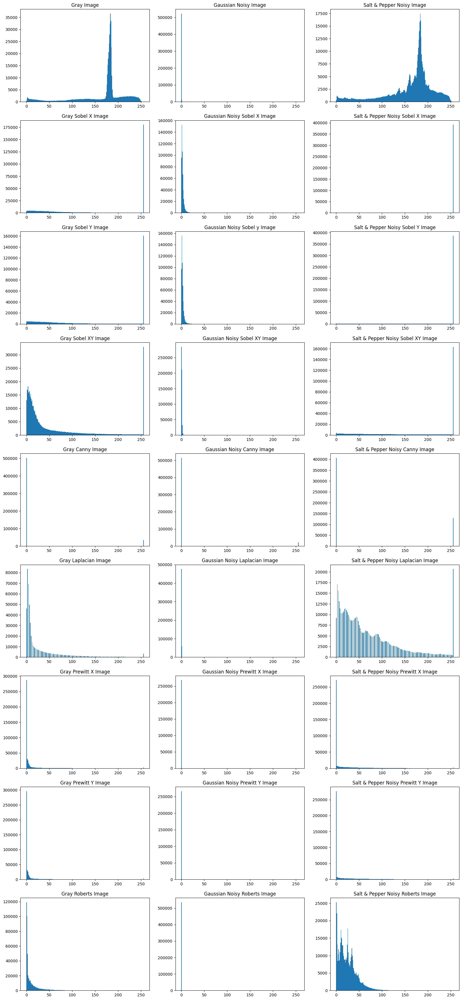

In [13]:
# Final Histogram Comparison

fig = plt.figure(figsize=(20, 45))

# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 1)
plt.hist(gray_blurred_image.ravel(),256,[0,256])
plt.title("Gray Image")

fig.add_subplot(9, 3, 2)
plt.hist(gaussian_noise_blurred_image.ravel(),256,[0,256])                                          # Input Images
plt.title("Gaussian Noisy Image")

fig.add_subplot(9, 3, 3)
plt.hist(salt_pepper_noise_blurred_image.ravel(),256,[0,256])
plt.title("Salt & Pepper Noisy Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 4)
plt.hist(gray_sobel_x_image.ravel(),256,[0,256])
plt.title("Gray Sobel X Image")

fig.add_subplot(9, 3, 5)
plt.hist(gaussian_noise_sobel_x_image.ravel(),256,[0,256])                                           # Sobel X Images
plt.title("Gaussian Noisy Sobel X Image")

fig.add_subplot(9, 3, 6)
plt.hist(salt_pepper_noise_sobel_x_image.ravel(),256,[0,256])
plt.title("Salt & Pepper Noisy Sobel X Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 7)
plt.hist(gray_sobel_y_image.ravel(),256,[0,256])

plt.title("Gray Sobel Y Image")

fig.add_subplot(9, 3, 8)
plt.hist(gaussian_noise_sobel_y_image.ravel(),256,[0,256])                                           # Sobel Y Images   
plt.title("Gaussian Noisy Sobel y Image")

fig.add_subplot(9, 3, 9)
plt.hist(salt_pepper_noise_sobel_y_image.ravel(),256,[0,256])

plt.title("Salt & Pepper Noisy Sobel Y Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 10)
plt.hist(gray_sobel_xy_image.ravel(),256,[0,256])

plt.title("Gray Sobel XY Image")

fig.add_subplot(9, 3, 11)
plt.hist(gaussian_noise_sobel_xy_image.ravel(),256,[0,256])                                         # Sobel XY Images     
plt.title("Gaussian Noisy Sobel XY Image")

fig.add_subplot(9, 3, 12)
plt.hist(salt_pepper_noise_sobel_xy_image.ravel(),256,[0,256])

plt.title("Salt & Pepper Noisy Sobel XY Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 13)
plt.hist(gray_canny_image.ravel(),256,[0,256])

plt.title("Gray Canny Image")

fig.add_subplot(9, 3, 14)
plt.hist(gaussian_noise_canny_image.ravel(),256,[0,256])                                             # Canny Images
plt.title("Gaussian Noisy Canny Image")

fig.add_subplot(9, 3, 15)
plt.hist(salt_pepper_noise_canny_image.ravel(),256,[0,256])

plt.title("Salt & Pepper Noisy Canny Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 16)
plt.hist(gray_laplacian_image.ravel(),256,[0,256])

plt.title("Gray Laplacian Image")

fig.add_subplot(9, 3, 17)
plt.hist(gaussian_noise_laplacian_image.ravel(),256,[0,256])                                        # Laplacian Images    
plt.title("Gaussian Noisy Laplacian Image")

fig.add_subplot(9, 3, 18)
plt.hist(salt_pepper_noise_laplacian_image.ravel(),256,[0,256])

plt.title("Salt & Pepper Noisy Laplacian Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 19)
plt.hist(gray_prewitt_x_image.ravel(),256,[0,256])

plt.title("Gray Prewitt X Image")

fig.add_subplot(9, 3, 20)
plt.hist(gaussian_noise_prewitt_x_image.ravel(),256,[0,256])                                       # Prewitt X Images     
plt.title("Gaussian Noisy Prewitt X Image")

fig.add_subplot(9, 3, 21)
plt.hist(salt_pepper_noise_prewitt_x_image.ravel(),256,[0,256])

plt.title("Salt & Pepper Noisy Prewitt X Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 22)
plt.hist(gray_prewitt_y_image.ravel(),256,[0,256])

plt.title("Gray Prewitt Y Image")

fig.add_subplot(9, 3, 23)
plt.hist(gaussian_noise_prewitt_y_image.ravel(),256,[0,256])                                       # Prewitt Y Images     
plt.title("Gaussian Noisy Prewitt Y Image")

fig.add_subplot(9, 3, 24)
plt.hist(salt_pepper_noise_prewitt_y_image.ravel(),256,[0,256])

plt.title("Salt & Pepper Noisy Prewitt Y Image")
# ---------------------------------------------------------------------------------------------------------------------



# ---------------------------------------------------------------------------------------------------------------------
fig.add_subplot(9, 3, 25)
plt.hist(gray_roberts_image.ravel(),256,[0,256])

plt.title("Gray Roberts Image")

fig.add_subplot(9, 3, 26)
plt.hist(gaussian_noise_roberts_image.ravel(),256,[0,256])                                           # Roberts Images     
plt.title("Gaussian Noisy Roberts Image")

fig.add_subplot(9, 3, 27)
plt.hist(salt_pepper_noise_roberts_image.ravel(),256,[0,256])

plt.title("Salt & Pepper Noisy Roberts Image")
# ---------------------------------------------------------------------------------------------------------------------